# Kitti odo loader

In [43]:
import os
import sys
import numpy as np 
import scipy.misc
import os, sys
import cv2
# from glob import glob
sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_tools')
np.set_printoptions(precision=8, suppress=True)
from path import Path
from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

from torch.utils.data import Dataset

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import argparse
from pebble import ProcessPool
%matplotlib inline
import matplotlib.pyplot as plt
import torch

import dsac_tools.utils_F as utils_F
import dsac_tools.utils_geo as utils_geo
import dsac_tools.utils_misc as utils_misc
import dsac_tools.utils_vis as utils_vis
import dsac_tools.utils_opencv as utils_opencv

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str, default="/data/kitti/odometry", help="path to dataset")   
parser.add_argument("--num_threads", type=int, default=1, help="number of thread to load data")
parser.add_argument("--img_height", type=int, default=376, help="number of thread to load data")
parser.add_argument("--img_width", type=int, default=1241, help="number of thread to load data")
# parser.add_argument("--img_height", type=int, default=370, help="number of thread to load data")
# parser.add_argument("--img_width", type=int, default=1226, help="number of thread to load data")
parser.add_argument('--dump', action='store_true', default=False)
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=True,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--dump_root", type=str, default='dump', help="Where to dump the data")

args = parser.parse_args('--dump --with_pose --with_X \
    --dataset_dir /data/kitti/odometry \
    --dump_root /data/kitti/odometry/dump_tmp'.split())
print(args)

%reload_ext autoreload
%autoreload 2

from kitti_odo_loader import KittiOdoLoader

data_loader = KittiOdoLoader(args.dataset_dir,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             cam_ids=['02'],
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift)

print(data_loader.scenes['train'])
print(data_loader.scenes['test'])

# drive_path_test = data_loader.get_drive_path(date_name, seq_name)
# data_loader.scenes = [drive_path_test]

# n_scenes = len(data_loader.scenes)
# print('Found {} potential scenes'.format(n_scenes))

# args_dump_root = Path(args.dump_root)
# args_dump_root.mkdir_p()

# print('== Retrieving frames')
scene_list = data_loader.collect_scene_from_drive(data_loader.scenes['train'][4])
scene_data = scene_list[0]

print(scene_data['N_frames'])

2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] INFO +++ Dumping as npy
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000000.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000001.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000002.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000003.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARN

Namespace(dataset_dir='/data/kitti/odometry', dump=True, dump_root='/data/kitti/odometry/dump_tmp', img_height=376, img_width=1241, num_threads=1, with_X=True, with_pose=True, with_sift=False)
[Path('/data/kitti/odometry/sequences/00'), Path('/data/kitti/odometry/sequences/01'), Path('/data/kitti/odometry/sequences/02'), Path('/data/kitti/odometry/sequences/03'), Path('/data/kitti/odometry/sequences/04'), Path('/data/kitti/odometry/sequences/05'), Path('/data/kitti/odometry/sequences/06'), Path('/data/kitti/odometry/sequences/07'), Path('/data/kitti/odometry/sequences/08')]
[]


2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000011.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000012.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000013.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000014.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:42 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000015.png] Zooming the image (H370, 

2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000050.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000051.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000052.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000053.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000054.png] Zooming the image (H370, 

2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000089.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000090.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000091.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000092.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:43 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000093.png] Zooming the image (H370, 

2019-04-09 01:41:44 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000128.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:44 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000129.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:44 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000130.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:44 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000131.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:44 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000132.png] Zooming the image (H370, 

2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000167.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000168.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000169.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000170.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000171.png] Zooming the image (H370, 

2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000206.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000207.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000208.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000209.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:45 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000210.png] Zooming the image (H370, 

2019-04-09 01:41:46 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000245.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:46 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000246.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:46 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000247.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:46 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000248.png] Zooming the image (H370, W1226) with zoom_xW=1.012235, zoom_yH=1.016216 to (H376, W1241).
2019-04-09 01:41:46 ruizhu-Alienware-Area-51-R5 root[31231] WARNING [/data/kitti/odometry/sequences/04/image_2/000249.png] Zooming the image (H370, 

271


# Verify my rectification

(376, 1241)
[376, 1241] (1.0, 1.0)
Reading from input list of param_list=[K, im_shape].


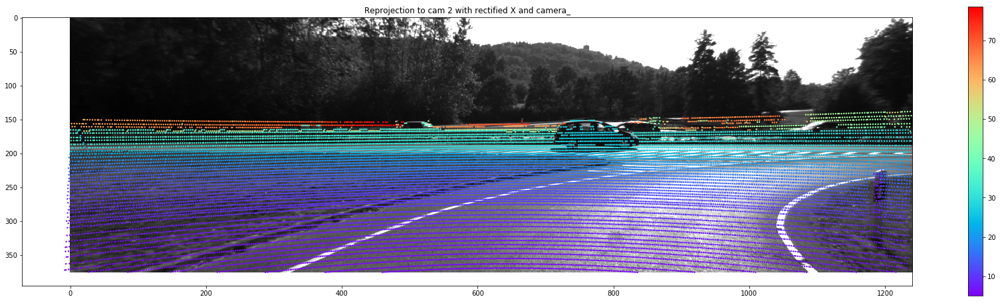

[[718.856    0.     607.1928   0.    ]
 [  0.     718.856  185.2157   0.    ]
 [  0.       0.       1.       0.    ]]


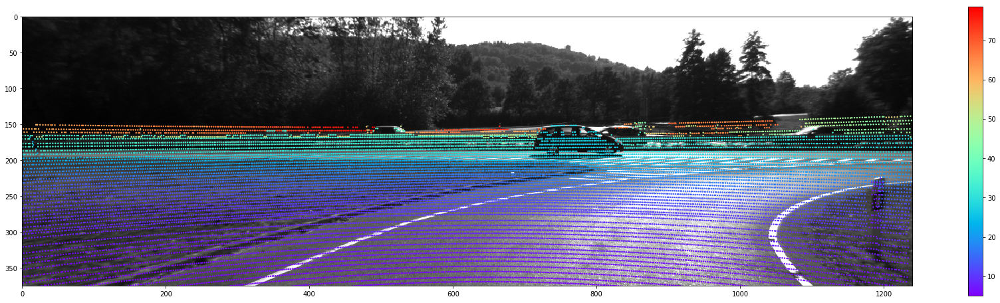

[[-0.         -0.        ]
 [-0.         -0.        ]
 [-0.         -0.        ]
 ...
 [-0.00000001 -0.00000001]
 [-0.00000001 -0.00000001]
 [-0.00000001 -0.00000001]]


In [90]:
idx = 0
# im1 = plt.imread(scene_data['img_files'][idx])
im1, _ = data_loader.load_image(scene_data, idx)
print(im1.shape)

P = scene_data['calibs']['P_rect_ori_dict']['02']
X_rect = scene_data['X_rect'][idx][scene_data['val_idxes'][idx], :]
X_cam0 = scene_data['X_cam0'][idx][scene_data['val_idxes'][idx], :]
print(scene_data['calibs']['im_shape'], scene_data['calibs']['zoom_xy'])
X_show = X_rect if scene_data['cid']=='02' else X_cam0
c, x1 = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X_show, im1, visualize=True, param_list=[scene_data['calibs']['K'], scene_data['calibs']['im_shape']])

velo_homo_trans = utils_misc.homo_np(X_cam0).T
# # velo = load_velo_scan('/data/kitti/raw/2011_09_30/2011_09_30_drive_0016_sync/velodyne_points/data/0000000000.bin')[:, :3]
# velo = load_velo_scan('/data/kitti/odometry/sequences/04/velodyne/000000.bin')[:, :3]
# velo_homo = utils_misc.homo_np(velo)
# velo_homo_trans = scene_data['calibs']['cam_2rect'] @ scene_data['calibs']['velo2cam'] @ velo_homo.T

P = scene_data['calibs']['P_rect_ori_dict'][scene_data['cid']]
print(P)
x_homo = (P @ velo_homo_trans).T
x = utils_misc.de_homo_np(x_homo)
plt.figure(figsize=(30, 8))
plt.imshow(im1, cmap=None if len(im1.shape)==3 else plt.get_cmap('gray'))
val_inds = utils_vis.scatter_xy(x, x_homo[:, 2], scene_data['calibs']['im_shape'], '', new_figure=False, set_lim=True)
print(x-x1)

# Get ij

In [50]:
from numpy.linalg import inv

i = 8
delta_ij = 1
j = i + delta_ij

def get_ij(i, j, data_loader, scene_data, visualize=True):
    im1, _ = data_loader.load_image(scene_data, i)
    im2, _ = data_loader.load_image(scene_data, j)
    pose1 = scene_data['poses'][i]
    pose2 = scene_data['poses'][j]
    delta_Rtij = inv(utils_misc.Rt_pad(pose2)) @ utils_misc.Rt_pad(pose1) # pose is for **camera**(0) pose; delta_Rij is for **scene** motion

    X_rect_i = scene_data['X_cam2'][i][scene_data['val_idxes'][i], :]
    X_cam0_i = scene_data['X_cam0'][i][scene_data['val_idxes'][i], :]
    X_rect_j = scene_data['X_cam2'][j][scene_data['val_idxes'][j], :]
    X_cam0_j = scene_data['X_cam0'][j][scene_data['val_idxes'][j], :]

    P = scene_data['calibs']['P_rect_ori_dict'][scene_data['cid']]

    # Vis1: with recfitied proj on Cam_cid
    if scene_data['cid']=='02':
        print('Recfitying delta_Rtij to cam %s.'%scene_data['cid'])
        delta_Rtij_camid = scene_data['calibs']['Rtl_gt'] @ delta_Rtij @ inv(scene_data['calibs']['Rtl_gt'])
    else:
        delta_Rtij_camid = delta_Rtij
    
    delta_Rtij_1 = utils_misc.normalize_Rt_to_1(delta_Rtij)
    delta_Rtij_T_1 = utils_misc.normalize_Rt_to_1(scene_data['calibs']['Rtl_gt'] @ delta_Rtij @ inv(scene_data['calibs']['Rtl_gt']))
    print(delta_Rtij_1)
    print(delta_Rtij_T_1)
    print(utils_geo.vector_angle(delta_Rtij_1[:, 3:4], delta_Rtij_T_1[:, 3:4]))
    
    delta_Rtij_camid_inv = inv(delta_Rtij_camid)
    
    param_list = [scene_data['calibs']['K'], scene_data['calibs']['im_shape']]
    
    X_show_i = X_rect_i if scene_data['cid']=='02' else X_cam0_i
    utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X_show_i, im1, visualize=visualize, title_appendix='[1]-%d_to_i%d'%(i, j), param_list=param_list)
    _, x1 = utils_vis.reproj_and_scatter(utils_misc.Rt_depad(delta_Rtij_camid), X_show_i, im2, visualize=visualize, title_appendix='[1]-%d_to_%d'%(i, j), param_list=param_list, set_lim=True)
#     print(X_show_i, im2.shape)
    print(x1)
#     utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X_rect_j, im2, visualize=True, title_appendix='[1]-j_to_j', param_list=param_list)

    # Vis2: with vanilla proj on Cam 0
    # # i to i
    x_homo_i = (P @ utils_misc.homo_np(X_cam0_i).T).T
    x_i = utils_misc.de_homo_np(x_homo_i)
    plt.figure(figsize=(30, 8))
    plt.imshow(im1, cmap=None if len(im1.shape)==3 else plt.get_cmap('gray'))
    val_inds = utils_vis.scatter_xy(x_i, x_homo_i[:, 2], scene_data['calibs']['im_shape'], title='[2]-i_to_i', new_figure=False, set_lim=True)

    # i to j
    x_homo_j = (P @ delta_Rtij @ utils_misc.homo_np(X_cam0_i).T).T
    x_j = utils_misc.de_homo_np(x_homo_j)
#     if visualize:
    plt.figure(figsize=(30, 8))
    plt.imshow(im2, cmap=None if len(im2.shape)==3 else plt.get_cmap('gray'))
    val_inds = utils_vis.scatter_xy(x_j, x_homo_j[:, 2], scene_data['calibs']['im_shape'], title='[2]-i_to_j', new_figure=False, set_lim=True)
#     print(x_j)
    
    # # j to j
    # x_homo_j = (P @ utils_misc.homo_np(X_cam0_j).T).T
    # x_j = utils_misc.de_homo_np(x_homo_j)
    # plt.figure(figsize=(30, 8))
    # plt.imshow(im2)
    # val_inds = utils_vis.scatter_xy(x_j, x_homo_j[:, 2], scene_data['calibs']['im_shape'], title='[2]-j_to_j', new_figure=False, set_lim=True)

    # print(x1)
    print(x_j-x1)
    
    angle_R = utils_geo.rot12_to_angle_error(np.eye(3), delta_Rtij_camid_inv[:3, :3])
    angle_t = utils_geo.vector_angle(np.array([[0.], [0.], [1.]]), delta_Rtij_camid_inv[:3, 3:4])
    print('>>>>>>>>>>>>>>>> Between frame %d and %d: \nThe rotation angle (degree) %.4f, and translation angle (degree) %.4f'%(i, j, angle_R, angle_t))
    
    print(delta_Rtij_camid_inv[:3, 3:4])
    
    return X_rect_i, X_rect_i, utils_misc.Rt_depad(delta_Rtij_camid), utils_misc.Rt_depad(delta_Rtij_camid_inv), im1, im2

X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = get_ij(i, j, data_loader, scene_data, visualize=True)

KeyError: 'frame_ids'

## Test OpenCV-5

{'dsac': [], 'opencv_5': [], 'opencv_8': []}
[[ 1.        0.       -0.        0.      ]
 [-0.        1.       -0.       -0.015625]
 [ 0.        0.        1.        1.      ]]
[[ 1.          0.         -0.          0.00012208]
 [-0.          1.         -0.         -0.01562202]
 [ 0.          0.          1.          1.        ]]
0.007135084084284081
Reading from input list of param_list=[K, im_shape].
Reading from input list of param_list=[K, im_shape].


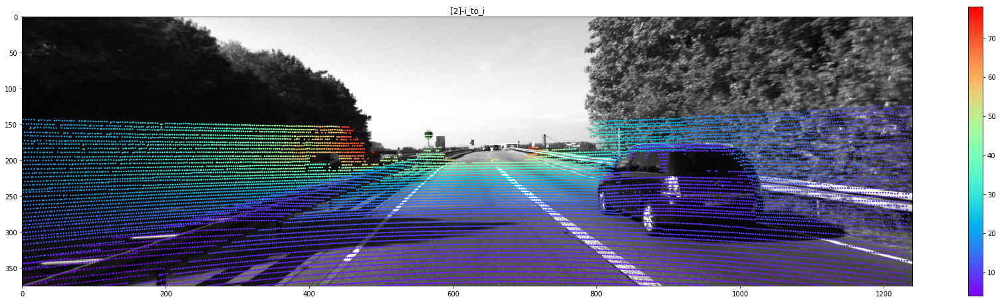

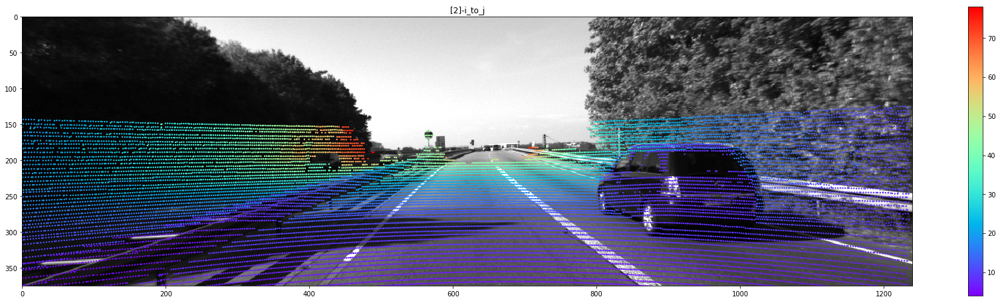

[[-0.         -0.        ]
 [-0.         -0.        ]
 [-0.         -0.        ]
 ...
 [-0.00000001 -0.00000001]
 [-0.00000001 -0.00000001]
 [-0.00000001 -0.00000001]]
>>>>>>>>>>>>>>>> Between frame 200 and 200: 
The rotation angle (degree) 0.0000, and translation angle (degree) 90.0163
# good points: 6447/(6447, 6447)


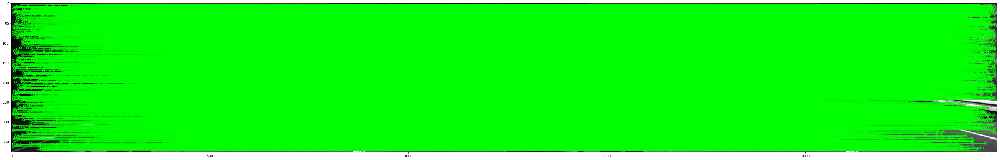

>>>>>>>>>>>>>>>> Running OpenCV camera pose estimation... [5 point] ---------------
# (6447, 0)/6447 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.0000, and translation error (degree) 90.0095
[[ 1.         -0.          0.          0.57735027]
 [ 0.          1.         -0.         -0.57735027]
 [-0.          0.          1.          0.57735027]]
<<<<<<<<<<<<<<<< DONE Running OpenCV camera pose estimation. ---------------


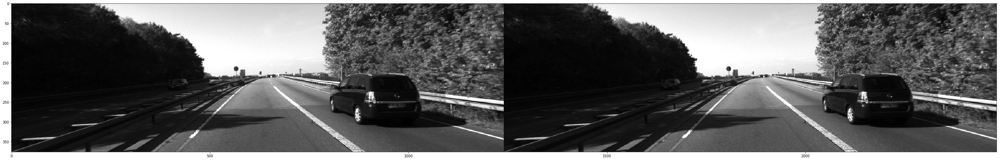

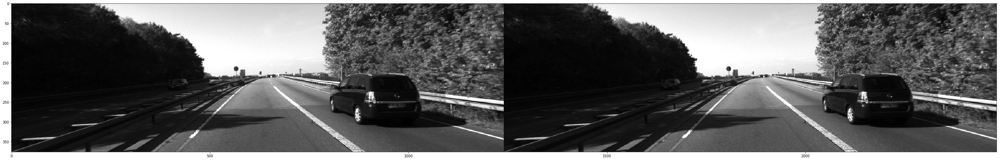

[]


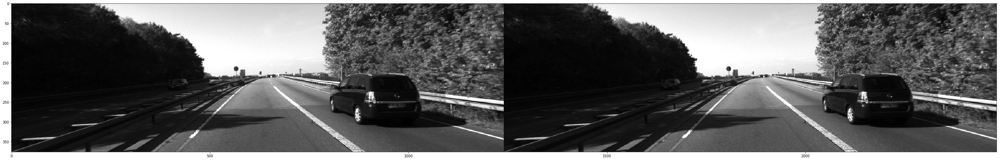

[]
>>>>>>>>>>>>>>>> Sample points, and check epipolar and Sampson distances. ---------------


AttributeError: 'NoneType' object has no attribute 'reshape'

In [8]:
# dsac_errors = {}
# opencv_5point_errors = {}
# opencv_8point_errors = {}
error_names = ['dsac', 'opencv_5', 'opencv_8']
errors = {error_name:[] for error_name in error_names}
print(errors)
from IPython.display import clear_output

# %reload_ext autoreload
%autoreload 2
delta_i = 0
# i = np.random.randint(N_frames-delta_i)
i = 200

np.set_printoptions(precision=8, suppress=True)
count = 0

K= scene_data['calibs']['K'].astype(np.float)
while i + delta_i < scene_data['N_frames']:
#     clear_output()
    j = i + delta_i

    # Get two frames
    X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = get_ij(i, j, data_loader, scene_data, visualize=False)

#     print('-- delta_Rtij_gt (scene)\n', delta_Rtij)
#     print('-- delta_Rtij_inv_gt (camera)\n', delta_Rtij_inv)
    E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:, :3], delta_Rtij[:, 3:4], K)    
    F_gt = F_gt_th.numpy()
    E_gt_th_inv, F_gt_th_inv = utils_F._E_F_from_Rt(delta_Rtij_inv[:, :3], delta_Rtij_inv[:, 3:4], K)    
    F_gt_inv = F_gt_th_inv.numpy()
    R2s, t2s, M2s = utils_F._get_M2s(E_gt_th)
#     print('-- E_gt (scene)\n', E_gt_th.numpy())

    img1_rgb_np, img2_rgb_np = np.array(img1_rgb), np.array(img2_rgb)
    img1, img2 = utils_opencv.PIL_to_gray(img1_rgb), utils_opencv.PIL_to_gray(img2_rgb)

#     # Keypoint detection and matching with SIFT
    x1_all, kp1, des1 = utils_opencv.SIFT_det(img1, img1_rgb, visualize=False)
    x2_all, kp2, des2 = utils_opencv.SIFT_det(img2, img2_rgb, visualize=False)
#     print(des1.shape, des2.shape)
    x1, x2, _, _ = utils_opencv.KNN_match(des1, des2, x1_all, x2_all, kp1, kp2, img1_rgb, img2_rgb, visualize=True, if_ratio_test=True)
    
    # OpenCV results
    ## 5 point
    M, error_Rt_5point, mask2, E_recover = utils_opencv.recover_camera_opencv(K, x2, x1, delta_Rtij_inv, five_point=True, threshold=0.01)
#     M, error_Rt_5point = utils_opencv.recover_camera_0(E_gt_th.numpy(), K, x2, x1, delta_Rtij_inv, five_point=True, threshold=0.001)
    errors['opencv_5'].append(error_Rt_5point)
    
    ## normalized 5 point
#     x1_normalizedK = utils_misc._de_homo(torch.mm(torch.inverse(torch.from_numpy(K)), utils_misc._homo(torch.from_numpy(x1)).t()).t()).numpy()
#     x2_normalizedK = utils_misc._de_homo(torch.mm(torch.inverse(torch.from_numpy(K)), utils_misc._homo(torch.from_numpy(x2)).t()).t()).numpy()
#     _, _ = utils_opencv.recover_camera_opencv(K, x2_normalizedK, x1_normalizedK, delta_Rtij_inv, five_point=True, \
#                                               threshold=0.001, if_normalized=True, method_app='-NormalizedX')
    ## 8 point
#     M, error_Rt_8point = utils_opencv.recover_camera_opencv(K, x2, x1, delta_Rtij_inv, five_point=False, threshold=0.01)
#     errors['opencv_8'].append(error_Rt_8point)
    
    ## Check geo dists
    x1_normalizedK = utils_misc.de_homo_np((np.linalg.inv(K) @ utils_misc.homo_np(x1).T).T)
    x2_normalizedK = utils_misc.de_homo_np((np.linalg.inv(K) @ utils_misc.homo_np(x2).T).T)
    K_th = torch.from_numpy(K)
    F_gt_normalized = K_th.t()@F_gt_th@K_th

    geo_dists = utils_F._sym_epi_dist(F_gt_normalized, torch.from_numpy(x1_normalizedK), torch.from_numpy(x2_normalizedK)).numpy()
    geo_thres = 1e-4
    mask_in = geo_dists<geo_thres
    mask_out = geo_dists>=geo_thres
    
    utils_vis.draw_corr(img1_rgb_np, img2_rgb_np, x1[mask2, :], x2[mask2, :], linewidth=2.)
    
    utils_vis.draw_corr(img1_rgb_np, img2_rgb_np, x1[mask2 & mask_in, :], x2[mask2 & mask_in, :], linewidth=2.)
    print(np.sort(geo_dists[mask2 & mask_in] / geo_thres))
    
    line_widths = geo_dists[mask2 & mask_out] / geo_thres
    line_widths[line_widths>10] = 10.
    utils_vis.draw_corr_widths(img1_rgb_np, img2_rgb_np, x1[mask2 & mask_out, :], x2[mask2 & mask_out, :], linewidth=line_widths, rescale=False, scale=2.)
    print(np.sort(geo_dists[mask2 & mask_out] / geo_thres)[::-1])
#     print(x1[mask2, :] - x2[mask2, :])
    
    ## Check epipolar constraints
    F_est = np.linalg.inv(K).T @ E_recover.T @ np.linalg.inv(K)
    random_idx, _, _, colors = utils_opencv.sample_and_check(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, img1_rgb_np, img2_rgb_np, F_gt, \
                                                             visualize=True, if_sample=False)
    _, _, _, _ = utils_opencv.sample_and_check(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, img1_rgb_np, img2_rgb_np, F_est, None, \
                                            visualize=True, if_sample=False, colors=colors, random_idx=random_idx)
#     colors = utils_opencv.show_epipolar_opencv(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, F_gt)
#     _ = utils_opencv.show_epipolar_opencv(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, F_est, colors=colors)

#     print('GT camera matrix: (camera)\n', delta_Rtij_inv)    
    
#     break

#     clear_output()
#     for idx in range(i):
#         def format_02f(x_tuple):
#             return '(%.2f, %.2f)'%(x_tuple[0], x_tuple[1])
#         print('- Frame %d and %d'%(idx, idx+1), format_02f(dsac_errors['%d'%idx]), format_02f(opencv_5point_errors['%d'%idx]), format_02f(opencv_8point_errors['%d'%idx]))
    
    i = i+delta_i
    count += 1
    
    if count > 10:
        break

In [87]:
errors['opencv_5'] 

[(0.06996553683947326, 0.20522786016589142),
 (0.10611577618035156, 0.024917460326886857),
 (0.12793920877621187, 0.2939338245518249),
 (0.11194446418774592, 0.3673697840855985),
 (0.2444937468383667, 0.8311667467237068),
 (0.1334262597127876, 0.0913132349767219),
 (0.2075188227241572, 0.4337880269171507),
 (0.11596425862431456, 0.3697619611834483),
 (0.2569272591286663, 1.6027051875751046),
 (0.08099945620639779, 0.44944618615671256),
 (0.046086749752730465, 0.7827426066001282)]

In [24]:
print(F_gt)

[[ 0.00000002  0.00000592 -0.00091161]
 [-0.00000592  0.00000004  0.003315  ]
 [ 0.00086366 -0.00387982  0.10707271]]


In [27]:
print(F_gt)

[[ 0.00000002  0.00000591 -0.00090954]
 [-0.0000059   0.00000004  0.00330723]
 [ 0.00086168 -0.00387059  0.10683118]]


In [472]:
kitti_raw_path = '/data/kitti/raw/%s/%s_drive_%s_sync'%(date_name, date_name, seq_name)
i = 0
im1 = plt.imread(kitti_raw_path+'/image_02/data/%010d.png'%i)

import os
import sys
# sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/FME')

import numpy as np 
import scipy.misc
import os, sys
import cv2
from glob import glob
sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_tools')

from path import Path
from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

from torch.utils.data import Dataset

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import argparse
from pebble import ProcessPool

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str, default="/data/KITTI/raw_meta/", help="path to dataset")   
parser.add_argument("--num_threads", type=int, default=1, help="number of thread to load data")
parser.add_argument("--img_height", type=int, default=128, help="number of thread to load data")
parser.add_argument("--img_width", type=int, default=416, help="number of thread to load data")
parser.add_argument("--static_frames_file", type=str, default="ref/static_frames.txt", help="static data file path")
parser.add_argument("--test_scene_file", type=str, default="ref/test_scenes_eigen.txt", help="test data file path")
parser.add_argument('--dump', action='store_true', default=False)
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=True,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--dump_root", type=str, default='dump', help="Where to dump the data")

args = parser.parse_args('--dump --with_X --with_pose --with_sift \
    --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt \
    --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt \
    --dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw \
    --dump_root /home/ruizhu/Documents/Datasets/kitti/corr_dump_tmp'.split())
print(args)

%reload_ext autoreload
%autoreload 2

from kitti_raw_loader import KittiRawLoader

data_loader = KittiRawLoader(args.dataset_dir,
                             static_frames_file=args.static_frames_file,
                             test_scene_file=args.test_scene_file,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift)

drive_path_test = data_loader.get_drive_path(date_name, seq_name)
data_loader.scenes = [drive_path_test]

n_scenes = len(data_loader.scenes)
print('Found {} potential scenes'.format(n_scenes))

args_dump_root = Path(args.dump_root)
args_dump_root.mkdir_p()

print('== Retrieving frames')
scene_list = data_loader.collect_scene_from_drive(data_loader.scenes[0])
scene_data = scene_list[0]

2019-04-06 02:54:00 ruizhu-Alienware-Area-51-R5 root[6888] INFO Static frames collected from /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt.
2019-04-06 02:54:00 ruizhu-Alienware-Area-51-R5 root[6888] INFO +++ Dumping as npy
2019-04-06 02:54:00 ruizhu-Alienware-Area-51-R5 root[6888] INFO Getting imu poses.../home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync
2019-04-06 02:54:01 ruizhu-Alienware-Area-51-R5 root[6888] INFO Getting SIFT.../home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync


Namespace(dataset_dir='/home/ruizhu/Documents/Datasets/kitti/raw', dump=True, dump_root='/home/ruizhu/Documents/Datasets/kitti/corr_dump_tmp', img_height=128, img_width=416, num_threads=1, static_frames_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt', test_scene_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt', with_X=True, with_pose=True, with_sift=True)
Found 1 potential scenes
== Retrieving frames
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)
(30,)

2019-04-06 02:54:05 ruizhu-Alienware-Area-51-R5 root[6888] INFO Getting X, rectifying.../home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync


In [31]:
# K = scene_data['intrinsics_ori']
# print(scene_data['imu2cam'])
# scene_data['imu_pose_matrix'][0]
a = kitti_two_frame_loader.load_cam_poses()

# X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = kitti_two_frame_loader.get_ij(0, 5, visualize=False)

[0.05956621 0.00029001 0.00257721]
[[ 1.          0.          0.          0.05984926]
 [ 0.          1.          0.         -0.00035793]
 [ 0.          0.          1.          0.00274588]
 [ 0.          0.          0.          1.        ]]


In [493]:
kitti_dump_dir = '/home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05_delta1235'
kitti_dump_path = kitti_dump_dir + '/%s_drive_%s_sync_02'%(date_name, seq_name)
a = np.load(kitti_dump_path+'/imu_pose_matrixs.npy')
print(a[0].reshape((4, 4)))

[[      0.34185175       0.93951723      -0.02108947  615002.96603968]
 [     -0.93975389       0.34176542      -0.0076823  5455903.25254747]
 [     -0.00001          0.02244511       0.99974808     112.83492279]
 [      0.               0.               0.               1.        ]]


In [396]:
E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:, :3], delta_Rtij[:, 3:4], kitti_two_frame_loader.K)
F_gt_normalized = K_th.t()@F_gt_th@K_th
geo_dists = utils_F._sym_epi_dist(F_gt_normalized, torch.from_numpy(x1_normalizedK), torch.from_numpy(x2_normalizedK)).numpy()
print(np.sort(geo_dists)[:20])

F_gt_normalized = K_th.t()@F_gt_th_inv@K_th
geo_dists = utils_F._sym_epi_dist(F_gt_normalized, torch.from_numpy(x1_normalizedK), torch.from_numpy(x2_normalizedK)).numpy()
print(np.sort(geo_dists)[:20])

[0.         0.         0.         0.00000001 0.00000002 0.00000002
 0.00000002 0.00000003 0.00000003 0.00000003 0.00000003 0.00000004
 0.00000004 0.00000004 0.00000005 0.00000006 0.00000008 0.00000008
 0.00000011 0.00000011]
[0.00000001 0.00000033 0.00000076 0.00000169 0.00000173 0.00000408
 0.00000627 0.00000755 0.00000873 0.00000961 0.00000975 0.00000978
 0.00000978 0.00001314 0.00001781 0.00002535 0.0000258  0.00002597
 0.00002658 0.00002826]


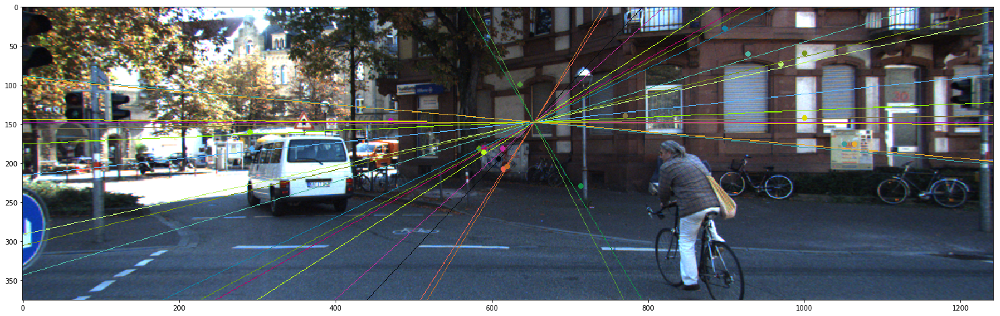

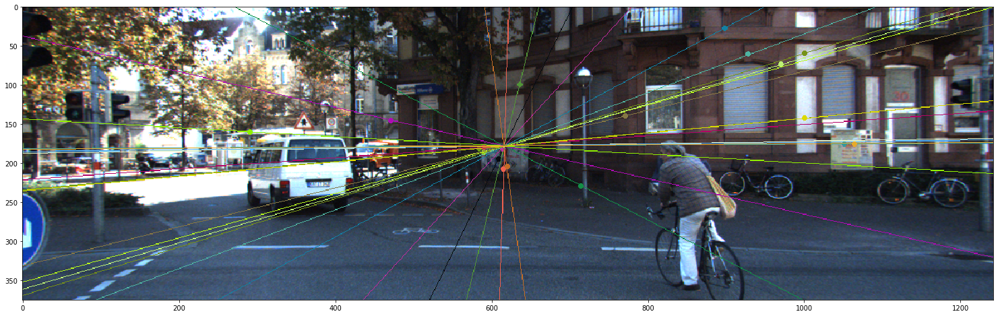

In [478]:
E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:, :3], delta_Rtij[:, 3:4], kitti_two_frame_loader.K)    
F_gt = F_gt_th.numpy()
F_est = np.linalg.inv(kitti_two_frame_loader.K).T @ E_recover.T @ np.linalg.inv(kitti_two_frame_loader.K)
colors = utils_opencv.show_epipolar_opencv(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, F_gt)
# _ = utils_opencv.show_epipolar_opencv(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, F_gt.T, colors=colors)
_ = utils_opencv.show_epipolar_opencv(x1[mask2, :], x2[mask2, :], img1_rgb, img2_rgb, F_est, colors=colors)

In [480]:
print(F_gt/F_gt[2, 2])
print(F_est/F_est[2, 2])

[[ 0.00000014  0.00005528 -0.00851376]
 [-0.00005525  0.00000037  0.0309575 ]
 [ 0.00806581 -0.03623089  1.        ]]
[[ 0.00000041  0.00004171 -0.00789495]
 [-0.00004144  0.00000033  0.021718  ]
 [ 0.00712634 -0.02577686  1.        ]]


In [453]:
E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:, :3], delta_Rtij[:, 3:4], kitti_two_frame_loader.K)
print(F_gt_th.numpy())
E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij_inv[:, :3], delta_Rtij_inv[:, 3:4], kitti_two_frame_loader.K)
print(F_gt_th.numpy())

[[-0.0000001   0.00000605 -0.00077663]
 [-0.00000608 -0.00000007  0.00362796]
 [ 0.00097336 -0.00410001 -0.0128017 ]]
[[-0.0000001  -0.00000608  0.00097336]
 [ 0.00000605 -0.00000007 -0.00410001]
 [-0.00077663  0.00362796 -0.0128017 ]]


In [113]:
""" Validate pose estimation with best 10 corres."""
# Validation: use best 10 corres with smalles Sampson distance to GT F to compute E and F
print('>>>>>>>>>>>>>>>> Check with best 20 corres. ---------------')
errors = utils_F._sampson_dist(F_gt_th, torch.from_numpy(x1).to(torch.float64), torch.from_numpy(x2).to(torch.float64), False)
sort_index = np.argsort(errors.numpy())

best_N = 10
mask_index = sort_index[:best_N]
# random.seed(10)
# mask_index = random.sample(range(x1.shape[0]), 8)
print('--- Best %d errors'%best_N, errors[mask_index].numpy())

# utils_vis.draw_corr(img1_rgb_np, img2_rgb_np, x1[mask_index, :], x2[mask_index, :], 2)

print('--- F GT\n', F_gt_th.numpy())

F_opencv, _ = cv2.findFundamentalMat(x1[mask_index, :], x2[mask_index, :], method=cv2.FM_8POINT) # based on the five-point algorithm solver in [Nister03]((1, 2) Nistér, D. An efficient solution to the five-point relative pose problem, CVPR 2003.). [SteweniusCFS](Stewénius, H., Calibrated Fivepoint solver. http://www.vis.uky.edu/~stewe/FIVEPOINT/) is also a related. 
F_opencv = F_gt_th.numpy()[2, 2] * F_opencv
print('--- F opencv\n', F_opencv)

F_est_th = utils_F._F_from_XY(torch.from_numpy(x1[mask_index, :]), torch.from_numpy(x2[mask_index, :]), W=None, show_debug=True)
print('--- F est (should agree with F opencv)\n', (F_est_th.numpy() / F_est_th.numpy()[2, 2] * F_gt_th.numpy()[2, 2]))
# print('--- F np\n', (F_np / F_np[2, 2] * F_gt_th.numpy()[2, 2]))

>>>>>>>>>>>>>>>> Check with best 20 corres. ---------------
--- Best 10 errors [0.00000002 0.0000048  0.00002903 0.0000495  0.00007592 0.00010668
 0.00011403 0.0001381  0.00015733 0.00017719]
--- F GT
 [[ 0.          0.00000191 -0.00035208]
 [-0.00000191  0.          0.00114994]
 [ 0.00034919 -0.00113943 -0.00073998]]
--- F opencv
 [[ 0.00000001  0.00001354 -0.0024141 ]
 [-0.00001353 -0.          0.00830387]
 [ 0.00238514 -0.00823205 -0.00073998]]
torch.Size([9, 9]) [[-0.00052033 -0.48609569  0.44675366]
 [ 0.48595796  0.00014706  0.25378852]
 [-0.44713389 -0.25224334 -0.00163816]]
torch.Size([1, 9, 9]) [[ 0.00052028  0.4860871  -0.44676015]
 [-0.4859495  -0.00014685 -0.25379458]
 [ 0.44714043  0.25224933  0.00163801]]
[info.Debug@_F_from_XY] Singualr values of XX:
 [7.25760372 5.94474669 3.55813572 1.99365658 1.74050238 0.43464962
 0.00929498 0.00238511 0.00002139]
torch.float64
--- F est (should agree with F opencv)
 [[ 0.00000001  0.00001354 -0.0024141 ]
 [-0.00001353 -0.          0

In [87]:
E_est_th = utils_F._E_from_XY(torch.from_numpy(x1[mask_index, :]), torch.from_numpy(x2[mask_index, :]), kitti_two_frame_loader.K_th, W=None, normalize=True, show_debug=False)
print(E_est_th.numpy())

torch.Size([1, 2]) torch.Size([])
[[ -0.09704182 -52.7275048    0.3529066 ]
 [ 52.630569     0.02172939  -0.29042068]
 [ -0.29505579  -0.10163205   0.00230653]]


In [108]:
E_est_th = utils_F._E_from_XY_batch(torch.from_numpy(x1).float().unsqueeze(0).cuda(), 
                                    torch.from_numpy(x2).float().unsqueeze(0).cuda(), 
                                    kitti_two_frame_loader.K_th.float().unsqueeze(0).cuda(), W=None, normalize=True, show_debug=False)
print(E_est_th.cpu()[0].numpy())

torch.Size([1, 818, 9])


RuntimeError: matrix row should be <= 32 (batch_svd_forward at torch_batch_svd.cpp:66)
frame #0: std::function<std::string ()>::operator()() const + 0x11 (0x7f0dd4ac6021 in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch/lib/libc10.so)
frame #1: c10::Error::Error(c10::SourceLocation, std::string const&) + 0x2a (0x7f0dd4ac58ea in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch/lib/libc10.so)
frame #2: torch_batch_svd::batch_svd_forward(at::Tensor, bool, double, int) + 0xe96 (0x7f0e132655f6 in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch_batch_svd-0.0.0-py3.6-linux-x86_64.egg/torch_batch_svd.cpython-36m-x86_64-linux-gnu.so)
frame #3: <unknown function> + 0x18fcd (0x7f0e13274fcd in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch_batch_svd-0.0.0-py3.6-linux-x86_64.egg/torch_batch_svd.cpython-36m-x86_64-linux-gnu.so)
frame #4: <unknown function> + 0x165c5 (0x7f0e132725c5 in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch_batch_svd-0.0.0-py3.6-linux-x86_64.egg/torch_batch_svd.cpython-36m-x86_64-linux-gnu.so)
frame #5: _PyCFunction_FastCallDict + 0x154 (0x5578d9dba744 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #6: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #7: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #8: PyEval_EvalCodeEx + 0x329 (0x5578d9e3c289 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #9: <unknown function> + 0x194094 (0x5578d9e3d094 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #10: PyObject_Call + 0x3e (0x5578d9dba54e in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #11: THPFunction_apply(_object*, _object*) + 0x581 (0x7f0e0f004ab1 in /home/ruizhu/anaconda3/envs/kitti_py36/lib/python3.6/site-packages/torch/lib/libtorch_python.so)
frame #12: _PyCFunction_FastCallDict + 0x91 (0x5578d9dba681 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #13: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #14: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #15: <unknown function> + 0x19253b (0x5578d9e3b53b in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #16: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #17: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #18: <unknown function> + 0x1918e4 (0x5578d9e3a8e4 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #19: <unknown function> + 0x192771 (0x5578d9e3b771 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #20: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #21: _PyEval_EvalFrameDefault + 0x10c7 (0x5578d9e67147 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #22: PyEval_EvalCodeEx + 0x329 (0x5578d9e3c289 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #23: PyEval_EvalCode + 0x1c (0x5578d9e3d01c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #24: <unknown function> + 0x1bad97 (0x5578d9e63d97 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #25: _PyCFunction_FastCallDict + 0x91 (0x5578d9dba681 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #26: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #27: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #28: _PyGen_Send + 0x256 (0x5578d9e44506 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #29: _PyEval_EvalFrameDefault + 0x13b5 (0x5578d9e67435 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #30: _PyGen_Send + 0x256 (0x5578d9e44506 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #31: _PyEval_EvalFrameDefault + 0x13b5 (0x5578d9e67435 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #32: _PyGen_Send + 0x256 (0x5578d9e44506 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #33: _PyCFunction_FastCallDict + 0x115 (0x5578d9dba705 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #34: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #35: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #36: <unknown function> + 0x19253b (0x5578d9e3b53b in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #37: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #38: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #39: <unknown function> + 0x19253b (0x5578d9e3b53b in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #40: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #41: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #42: <unknown function> + 0x1918e4 (0x5578d9e3a8e4 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #43: _PyFunction_FastCallDict + 0x3da (0x5578d9e3be6a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #44: _PyObject_FastCallDict + 0x26f (0x5578d9dbab0f in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #45: _PyObject_Call_Prepend + 0x63 (0x5578d9dbf6a3 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #46: PyObject_Call + 0x3e (0x5578d9dba54e in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #47: _PyEval_EvalFrameDefault + 0x19ec (0x5578d9e67a6c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #48: <unknown function> + 0x191a76 (0x5578d9e3aa76 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #49: <unknown function> + 0x192771 (0x5578d9e3b771 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #50: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #51: _PyEval_EvalFrameDefault + 0x10c7 (0x5578d9e67147 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #52: <unknown function> + 0x19b070 (0x5578d9e44070 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #53: _PyCFunction_FastCallDict + 0x91 (0x5578d9dba681 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #54: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #55: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #56: <unknown function> + 0x191bfe (0x5578d9e3abfe in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #57: <unknown function> + 0x192771 (0x5578d9e3b771 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #58: <unknown function> + 0x198505 (0x5578d9e41505 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #59: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #60: <unknown function> + 0x19b070 (0x5578d9e44070 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #61: _PyCFunction_FastCallDict + 0x91 (0x5578d9dba681 in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #62: <unknown function> + 0x19842c (0x5578d9e4142c in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)
frame #63: _PyEval_EvalFrameDefault + 0x30a (0x5578d9e6638a in /home/ruizhu/anaconda3/envs/kitti_py36/bin/python)


In [19]:
E_est_th = utils_F._E_from_XY(torch.from_numpy(x1[mask_index, :]), torch.from_numpy(x2[mask_index, :]), kitti_two_frame_loader.K_th, W=None, show_debug=True)
print(E_est_th.numpy())
print(E_gt_th.numpy())

[info.Debug @_E_from_XY] Singualr values of XX:
 [7.25760372 5.94474669 3.55813572 1.99365658 1.74050238 0.43464962
 0.00929498 0.00238511 0.00002139]
[info.Debug @_E_from_XY] Singular values for recovered E(F):
 [0.70770214 0.70651092 0.00001416]
[[ -0.09704182 -52.7275048    0.3529066 ]
 [ 52.630569     0.02172939  -0.29042068]
 [ -0.29505579  -0.10163205   0.00230653]]
[[ 0.00074055  0.99344468 -0.0154183 ]
 [-0.99356436  0.000848   -0.00943982]
 [ 0.01455587  0.01733139 -0.000131  ]]


In [243]:
def get_mean_std(errors):
    errors_R = [errors[key][0] for key in errors.keys()]
    errors_t = [errors[key][1] for key in errors.keys()]
    print('error_R = %.4f ± %.4f'%(np.mean(errors_R), np.std(errors_R)), 'error_t = %.4f ± %.4f'%(np.mean(errors_t), np.std(errors_t)))
    #     errors_t = [error[1] for error in errors]
print('DSAC:'); get_mean_std(dsac_errors)
print('OpenCV 5-point:'); get_mean_std(opencv_5point_errors)
print('OpenCV 8-point:'); get_mean_std(opencv_8point_errors)

DSAC:
error_R = 0.1283 ± 0.0905 error_t = 4.9801 ± 10.3773
OpenCV 5-point:
error_R = 0.6803 ± 0.4693 error_t = 64.2246 ± 39.7119
OpenCV 8-point:
error_R = 0.6216 ± 0.6668 error_t = 14.6624 ± 21.8955


# Test SIFT match

Between frame 302 and 320: The rotation angle (degree) 0.0473, and translation angle (degree) 96.4503
# kps: 50, descriptors: (50, 128)
# kps: 50, descriptors: (50, 128)
(50, 2) (50, 2)
# good points:  35
50 35


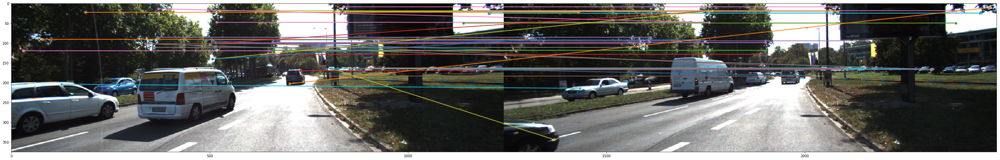

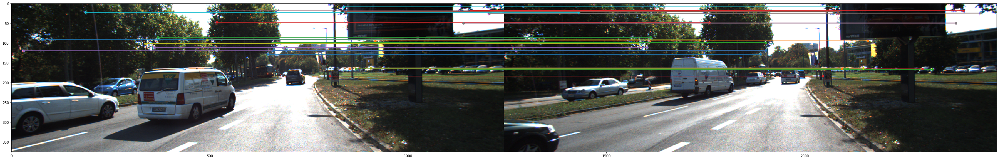

In [38]:
%reload_ext autoreload
%autoreload 2
delta_i = 18
# i = np.random.randint(kitti_two_frame_loader.N_frames-delta_i)
i = 302
np.set_printoptions(precision=8, suppress=True)
j = i + delta_i

# Get two frames
X_rect_i, X_rect_i_vis, delta_Rtij, delta_Rtij_inv, img1_rgb, img2_rgb = kitti_two_frame_loader.get_ij(i, j, visualize=False)

img1_rgb_np, img2_rgb_np = np.array(img1_rgb), np.array(img2_rgb)
img1, img2 = utils_opencv.PIL_to_gray(img1_rgb), utils_opencv.PIL_to_gray(img2_rgb)

x1_all, kp1, des1 = utils_opencv.SIFT_det(img1, img1_rgb, nfeatures=50, visualize=False)
x2_all, kp2, des2 = utils_opencv.SIFT_det(img2, img2_rgb, nfeatures=50, visualize=False)

print(x1_all.shape, x2_all.shape)
# print(des1.shape, des2.shape)
x1, x2, all_ij, good_ij = utils_opencv.KNN_match(des1, des2, x1_all, x2_all, kp1, kp2, img1_rgb, img2_rgb, visualize=False, if_BF=False)
print(all_ij.shape[0], good_ij.shape[0])

matches_all = np.hstack((x1_all[all_ij[:, 0], :], x2_all[all_ij[:, 1], :]))
matches_good = np.hstack((x1_all[good_ij[:, 0], :], x2_all[good_ij[:, 1], :]))
utils_vis.draw_corr(np.array(img1_rgb), np.array(img2_rgb), matches_all[:, :2], matches_all[:, 2:], linewidth=2)
utils_vis.draw_corr(np.array(img1_rgb), np.array(img2_rgb), matches_good[:, :2], matches_good[:, 2:], linewidth=2)

# Check ORB-SLAM results

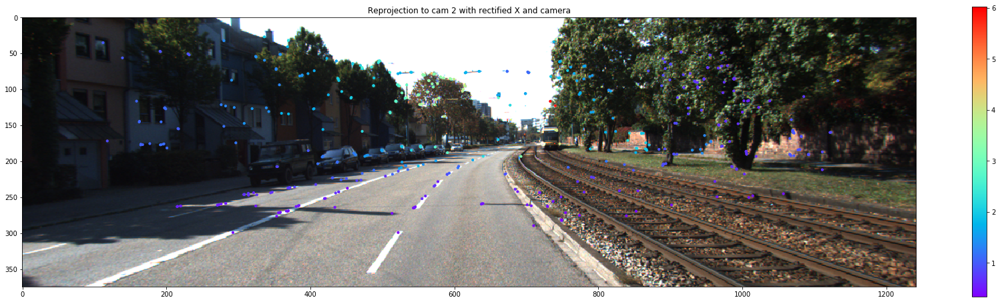

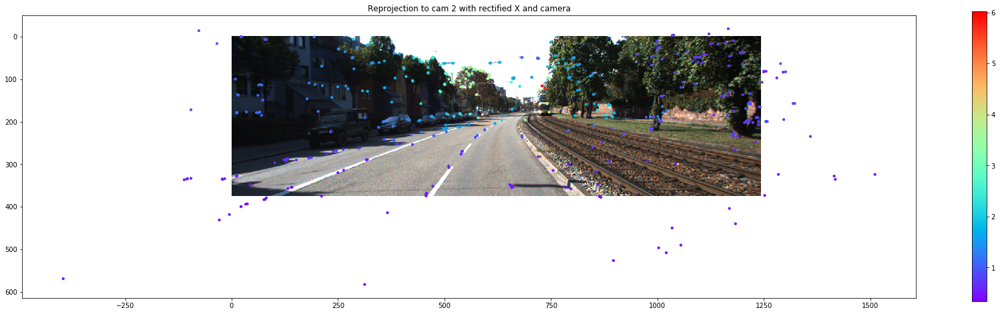

In [55]:
Xs = np.load('kitti_tools/ORB_checks/world_points.npy')
Ps = np.load('kitti_tools/ORB_checks/orb_poses.npy')

K_homo = np.hstack((kitti_two_frame_loader.K, np.zeros((3, 1))))
X_homo = utils_misc.homo_np(Xs[0])

x1 = utils_misc.de_homo_np((K_homo @ Ps[0] @ X_homo.T).T)
plt.figure(figsize=(30, 8))
plt.imshow(img1_rgb)
_ = utils_vis.scatter_xy(x1, X_homo[:, 2], kitti_two_frame_loader.im_shape, 'Reprojection to cam 2 with rectified X and camera', new_figure=False, s=10, set_lim=False)

x2 = utils_misc.de_homo_np((K_homo @ np.linalg.inv(Ps[5]) @ X_homo.T).T)
plt.figure(figsize=(30, 8))
plt.imshow(img2_rgb)
_ = utils_vis.scatter_xy(x2, X_homo[:, 2], kitti_two_frame_loader.im_shape, 'Reprojection to cam 2 with rectified X and camera', new_figure=False, s=10, set_lim=False)

In [58]:
P_orb = np.linalg.inv(Ps[5])
print(P_orb)

P_imu = delta_Rtij
print(P_imu) # indeed R2 = R1, t2 = \alpha t1

[[ 0.9999 -0.0014 -0.0127  0.0024]
 [ 0.0014  1.      0.0013  0.0001]
 [ 0.0127 -0.0013  0.9999 -0.248 ]
 [ 0.      0.      0.      1.    ]]
[[ 0.9999 -0.0016 -0.0129  0.0995]
 [ 0.0016  1.      0.001   0.0216]
 [ 0.0129 -0.001   0.9999 -6.766 ]]


[[ 0.9999 -0.0016 -0.0129  0.0995]
 [ 0.0016  1.      0.001   0.0216]
 [ 0.0129 -0.001   0.9999 -6.766 ]]
[[ 0.9999 -0.0014 -0.0127  0.0024]
 [ 0.0014  1.      0.0013  0.0001]
 [ 0.0127 -0.0013  0.9999 -0.248 ]]
27.280129087938253


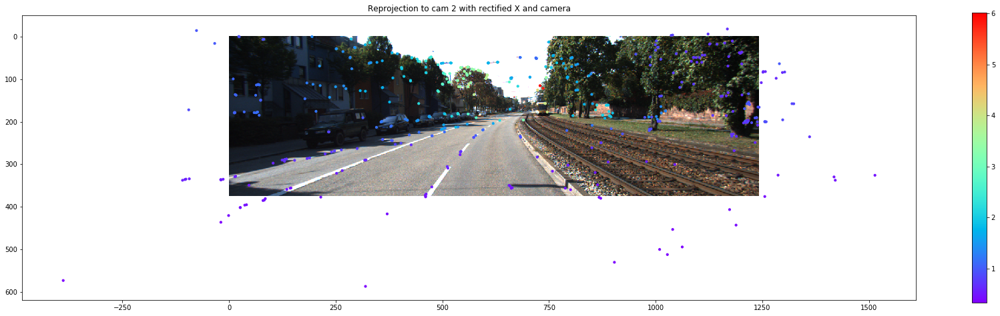

In [101]:
# How do you get delta_Rtij between frame 0 and 5
# Check the utils_kitti.get_ij() and utils_kitti.load_cam_poses(), utils_kitti.get_left_right_gt()
# Or I have the important steps extracted here:

# Step 1: in get_left_right_gt():
# You get the extrinsics of the left camera, which you can use to transform the velo points in camera2 to "recfitied left camera" which you can then use an **identity camera** to project to the left frame
Ml_gt = np.matmul(np.linalg.inv(kitti_two_frame_loader.K), kitti_two_frame_loader.dataset.calib.P_rect_20)
Rl_gt = Ml_gt[:, :3]
tl_gt = Ml_gt[:, 3:4]
Rtl_gt = np.vstack((np.hstack((Rl_gt, tl_gt)), np.array([0., 0., 0., 1.], dtype=np.float64)))

# Step 2: in load_cam_poses():
# You compute the transformation from the imu to the "recfitied left camera"
velo2cam_mat = kitti_two_frame_loader.dataset.calib.T_cam0_velo_unrect
imu2velo_mat = kitti_two_frame_loader.dataset.calib.T_velo_imu
cam_2rect_mat = kitti_two_frame_loader.dataset.calib.R_rect_00
imu2cam = Rtl_gt @ cam_2rect_mat @ velo2cam_mat @ imu2velo_mat

# Step 3: in load_cam_poses():
# You read in the oxt file and transform to imu pose with utils_kitti.pose_from_oxts_packet()
# Them you get the imu poses for each frame. We pick the 0th and 5th here:
P_imu_i = kitti_two_frame_loader.scene_data['imu_pose_matrix'][0]
P_imu_j = kitti_two_frame_loader.scene_data['imu_pose_matrix'][5]

# Step 4: in 
# You get the relative camera pose between frame i and j
odo_pose = imu2cam @ np.linalg.inv(P_imu_i) @ P_imu_j @ np.linalg.inv(imu2cam) # camera motion
ode_pose_scene = utils_misc.Rt_depad(np.linalg.inv(odo_pose)) # scene motion

print(odo_pose_scene)
print(P_orb[:3, :])

scale = odo_pose_scene[-1, -1] / P_orb[:3, :][-1, -1] # Hacky
print(scale)

## Try the projection
P5_recover = np.vstack((np.hstack((odo_pose_scene[:, :3], odo_pose_scene[:, 3:4]/scale)), np.ones((1, 4))))
x2 = utils_misc.de_homo_np((K_homo @ P5_recover @ X_homo.T).T)
plt.figure(figsize=(30, 8))
plt.imshow(img2_rgb)
_ = utils_vis.scatter_xy(x2, X_homo[:, 2], kitti_two_frame_loader.im_shape, 'Reprojection to cam 2 with rectified X and camera', new_figure=False, s=10, set_lim=False)

# Kitti loader

## Prepare data

In [3]:
%reload_ext autoreload
%autoreload 2
from path import Path
from tqdm import tqdm
from joblib import Parallel, delayed
from kitti_tools.kitti_raw_loader import KittiRawLoader
import argparse
import numpy as np

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str,
                    help='path to original dataset')
parser.add_argument("--dataset-format", type=str, default='kitti', choices=["kitti", "cityscapes"])
parser.add_argument("--static-frames", default=None,
                    help="list of imgs to discard for being static, if not set will discard them based on speed \
                    (careful, on KITTI some frames have incorrect speed)")
parser.add_argument("--with-X", action='store_true',
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with-pose", action='store_true',
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
# parser.add_argument("--no-train-gt", action='store_true',
#                     help="If selected, will delete ground truth depth to save space")
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument("--height", type=int, default=128, help="image height")
parser.add_argument("--width", type=int, default=416, help="image width")
# parser.add_argument("--depth-size-ratio", type=int, default=1, help="will divide depth size by that ratio")
parser.add_argument("--num-threads", type=int, default=6, help="number of threads to use")

args = parser.parse_args('--dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw --dataset-format kitti \
--dump-root /home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/ --width 1242 --height 375 \
--num-threads 6 --with-pose'.split())
print(args)
args_dump_root = Path(args.dump_root)
args_dump_root.mkdir_p()

data_loader = KittiRawLoader(args.dataset_dir,
                             static_frames_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt',
                             img_height=args.height,
                             img_width=args.width,
                             get_X=args.with_X,
                             get_pose=args.with_pose)

INFO:root:Static frames collected from /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt.


Namespace(dataset_dir='/home/ruizhu/Documents/Datasets/kitti/raw', dataset_format='kitti', dump_root='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/', height=375, num_threads=6, static_frames=None, width=1242, with_X=False, with_pose=True)


In [4]:
%reload_ext autoreload
%autoreload 2
from path import Path
from tqdm import tqdm
from joblib import Parallel, delayed
from kitti_tools.kitti_raw_loader import KittiRawLoader
import argparse
import numpy as np

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str,
                    help='path to original dataset')
parser.add_argument("--dataset-format", type=str, default='kitti', choices=["kitti", "cityscapes"])
parser.add_argument("--static-frames", default=None,
                    help="list of imgs to discard for being static, if not set will discard them based on speed \
                    (careful, on KITTI some frames have incorrect speed)")
parser.add_argument("--with-X", action='store_true',
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with-pose", action='store_true',
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
# parser.add_argument("--no-train-gt", action='store_true',
#                     help="If selected, will delete ground truth depth to save space")
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument("--height", type=int, default=128, help="image height")
parser.add_argument("--width", type=int, default=416, help="image width")
# parser.add_argument("--depth-size-ratio", type=int, default=1, help="will divide depth size by that ratio")
parser.add_argument("--num-threads", type=int, default=6, help="number of threads to use")

args = parser.parse_args('--dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw --dataset-format kitti \
--dump-root /home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/ --width 1242 --height 375 \
--num-threads 6 --with-pose'.split())
print(args)
args_dump_root = Path(args.dump_root)
args_dump_root.mkdir_p()

data_loader = KittiRawLoader(args.dataset_dir,
                             static_frames_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt',
                             img_height=args.height,
                             img_width=args.width,
                             get_X=args.with_X,
                             get_pose=args.with_pose)

# drive_path_test = data_loader.get_drive_path('2011_09_29', '0108')
# data_loader.scenes = [drive_path_test]

# Parallel(n_jobs=args.num_threads)(delayed(data_loader.dump_drive)(args, drive_path) for drive_path in tqdm(data_loader.scenes))

print('== Retrieving frames')
for drive_path in tqdm(data_loader.scenes):
    # # scene_list = data_loader.dump_drive(args, drive)
    scene_list = data_loader.collect_scenes(drive_path)
    data_loader.dump_drive(args, drive_path, scene_list)

print('== Generating train val lists')
np.random.seed(8964)
# to avoid data snooping, we will make two cameras of the same scene to fall in the same set, train or val
subdirs = args_dump_root.dirs() # e.g. Path('./data/kitti_dump/2011_09_30_drive_0034_sync_02')
canonic_prefixes = set([subdir.basename()[:-2] for subdir in subdirs]) # e.g. '2011_09_28_drive_0039_sync_'
with open(args_dump_root / 'train.txt', 'w') as tf:
    with open(args_dump_root / 'val.txt', 'w') as vf:
        for pr in tqdm(canonic_prefixes):
            corresponding_dirs = args_dump_root.dirs('{}*'.format(pr)) # e.g. [Path('./data/kitti_dump/2011_09_30_drive_0033_sync_03'), Path('./data/kitti_dump/2011_09_30_drive_0033_sync_02')]
            if np.random.random() < 0.0:
                for s in corresponding_dirs:
                    vf.write('{}\n'.format(s.name))
            else:
                for s in corresponding_dirs:
                    tf.write('{}\n'.format(s.name))
#                     if args.with_depth and args.no_train_gt:
#                         for gt_file in s.files('*.npy'):
#                             gt_file.remove_p()

INFO:root:Static frames collected from /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt.


Namespace(dataset_dir='/home/ruizhu/Documents/Datasets/kitti/raw', dataset_format='kitti', dump_root='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/', height=375, num_threads=6, static_frames=None, width=1242, with_X=False, with_pose=True)


TypeError: expected str, bytes or os.PathLike object, not NoneType

## Demo trainer

In [169]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument('--seed', default=0, type=int, help='seed for random functions, and network initialization')
parser.add_argument('--sequence-length', type=int, metavar='N', help='sequence length for training', default=2)
parser.add_argument('--epoch-size', default=0, type=int, metavar='N',
                    help='manual epoch size (will match dataset size if not set)')
parser.add_argument('--epochs', default=1, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument('-b', '--batch-size', default=1, type=int, metavar='N', 
                    help='mini-batch size')
parser.add_argument('-j', '--workers', default=6, type=int, metavar='N', 
                    help='number of data loading workers')

args = parser.parse_args('--dump-root /home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/ --sequence-length 2'.split())
print(args)

best_error = -1
n_iter = 0
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

from kitti_tools.sequence_folders import SequenceFolder
train_set = SequenceFolder(
        args.dump_root,
        transform=None,
        seed=args.seed,
        train=True,
        sequence_length=args.sequence_length
    )
print('{} samples found in {} train scenes'.format(len(train_set), len(train_set.scenes)))
# imgs, intrinsics, imu_pose_matrixs, scene, frame_ids = train_set.__getitem__(0)

train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=args.batch_size, shuffle=True,
        num_workers=args.workers, pin_memory=True)
if args.epoch_size == 0:
    args.epoch_size = len(train_loader) # len(scenes)//batch_size

def train_one_epoch(args, train_loader, epoch_size):
    global n_iter, device

    for i, (imgs, intrinsics, imu_pose_matrixs, scene_name, frame_ids, Xs, sift_kps, sift_deses) in enumerate(train_loader):
        imgs = [img.to(device) for img in imgs]
        intrinsics = intrinsics.to(device)
        imu_pose_matrixs = [imu_pose_matrix.to(device) for imu_pose_matrix in imu_pose_matrixs]
        frame_ids = [frame_id.to(device) for frame_id in frame_ids]
        if args.get_X:
            Xs = [X.to(device) for X in Xs]
            print(Xs[0].size)
        if args.get_sift:
            sift_kps = [sift_kp.to(device) for sift_kp in sift_kps]
            sift_deses = [sift_des.to(device) for sift_des in sift_deses]
        
#         im = imgs[0].cpu().numpy()
#         plt.imshow(np.squeeze(im).astype(np.int32))
#         plt.show()
        
for epoch in range(args.epochs):
    train_loss = train_one_epoch(args, train_loader, args.epoch_size)

Namespace(batch_size=1, dump_root='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/kitti_dump/', epoch_size=0, epochs=200, seed=0, sequence_length=2, workers=4)
153 samples found in 1 train scenes
tensor([[[[15., 15., 15.],
          [14., 14., 14.],
          [14., 14., 14.],
          ...,
          [33., 40., 50.],
          [32., 39., 49.],
          [32., 39., 49.]],

         [[15., 15., 15.],
          [15., 15., 15.],
          [15., 15., 15.],
          ...,
          [33., 40., 50.],
          [33., 40., 50.],
          [33., 40., 50.]],

         [[17., 17., 17.],
          [16., 16., 16.],
          [16., 16., 16.],
          ...,
          [33., 40., 50.],
          [34., 41., 51.],
          [34., 41., 51.]],

         ...,

         [[13., 13., 15.],
          [13., 13., 15.],
          [14., 14., 16.],
          ...,
          [16., 13., 20.],
          [17., 14., 21.],
          [17., 14., 21.]],

         [[14., 14., 16.],
          [14., 14., 16.],
        

tensor([[[[ 65.,  60.,  22.],
          [ 78.,  73.,  31.],
          [106., 100.,  52.],
          ...,
          [ 88.,  64.,  62.],
          [ 87.,  63.,  61.],
          [ 87.,  63.,  61.]],

         [[ 74., 107.,  80.],
          [ 64.,  95.,  64.],
          [ 59.,  85.,  48.],
          ...,
          [ 88.,  64.,  62.],
          [ 87.,  63.,  61.],
          [ 87.,  63.,  61.]],

         [[ 48.,  84.,  72.],
          [ 45.,  79.,  65.],
          [ 44.,  73.,  53.],
          ...,
          [ 85.,  61.,  59.],
          [ 87.,  63.,  61.],
          [ 87.,  63.,  61.]],

         ...,

         [[ 67.,  85.,  97.],
          [ 64.,  82.,  96.],
          [ 59.,  77.,  91.],
          ...,
          [ 45.,  60.,  83.],
          [ 46.,  60.,  86.],
          [ 48.,  60.,  86.]],

         [[ 68.,  86., 100.],
          [ 63.,  80.,  96.],
          [ 57.,  74.,  90.],
          ...,
          [ 45.,  60.,  83.],
          [ 48.,  60.,  84.],
          [ 48.,  60.,  86.]],



tensor([[[[ 21.,  27.,  23.],
          [ 18.,  23.,  19.],
          [ 14.,  16.,  15.],
          ...,
          [255., 255., 255.],
          [255., 255., 255.],
          [255., 255., 255.]],

         [[ 24.,  30.,  26.],
          [ 21.,  25.,  24.],
          [ 17.,  19.,  18.],
          ...,
          [255., 255., 255.],
          [255., 255., 255.],
          [255., 255., 255.]],

         [[ 25.,  31.,  29.],
          [ 23.,  27.,  26.],
          [ 19.,  21.,  20.],
          ...,
          [255., 255., 255.],
          [255., 255., 255.],
          [255., 255., 255.]],

         ...,

         [[ 60.,  65.,  68.],
          [ 58.,  63.,  67.],
          [ 55.,  60.,  64.],
          ...,
          [249., 253., 255.],
          [251., 255., 255.],
          [251., 255., 255.]],

         [[ 43.,  48.,  52.],
          [ 42.,  47.,  51.],
          [ 40.,  45.,  51.],
          ...,
          [246., 250., 253.],
          [250., 254., 255.],
          [250., 254., 255.]],



tensor([[[[47., 66., 62.],
          [44., 56., 54.],
          [40., 42., 41.],
          ...,
          [69., 68., 73.],
          [80., 79., 84.],
          [80., 79., 84.]],

         [[53., 74., 65.],
          [48., 64., 54.],
          [40., 45., 39.],
          ...,
          [86., 85., 90.],
          [88., 87., 92.],
          [88., 87., 92.]],

         [[46., 71., 50.],
          [43., 62., 43.],
          [33., 44., 28.],
          ...,
          [94., 93., 98.],
          [93., 92., 97.],
          [93., 92., 97.]],

         ...,

         [[39., 48., 55.],
          [38., 47., 54.],
          [35., 46., 52.],
          ...,
          [31., 39., 50.],
          [31., 40., 49.],
          [31., 40., 49.]],

         [[38., 51., 57.],
          [37., 50., 56.],
          [38., 49., 55.],
          ...,
          [32., 40., 51.],
          [34., 43., 52.],
          [34., 43., 52.]],

         [[32., 50., 54.],
          [33., 48., 53.],
          [35., 48., 54.],
         

tensor([[[[ 11.,  11.,  11.],
          [ 11.,  11.,  11.],
          [ 12.,  12.,  12.],
          ...,
          [ 30.,  36.,  48.],
          [ 37.,  43.,  55.],
          [ 37.,  43.,  55.]],

         [[ 14.,  14.,  14.],
          [ 14.,  14.,  14.],
          [ 14.,  14.,  14.],
          ...,
          [ 35.,  41.,  53.],
          [ 36.,  42.,  54.],
          [ 36.,  42.,  54.]],

         [[ 17.,  17.,  17.],
          [ 16.,  16.,  16.],
          [ 16.,  16.,  16.],
          ...,
          [ 39.,  45.,  57.],
          [ 36.,  42.,  54.],
          [ 36.,  42.,  54.]],

         ...,

         [[145., 150., 143.],
          [147., 152., 145.],
          [146., 151., 145.],
          ...,
          [234., 245., 251.],
          [234., 245., 251.],
          [231., 244., 250.]],

         [[144., 152., 141.],
          [143., 150., 142.],
          [139., 146., 138.],
          ...,
          [233., 246., 254.],
          [232., 245., 253.],
          [231., 246., 253.]],



tensor([[[[100., 102.,  55.],
          [ 97.,  99.,  59.],
          [ 84.,  89.,  57.],
          ...,
          [ 62.,  76.,  89.],
          [ 61.,  75.,  88.],
          [ 61.,  75.,  88.]],

         [[109., 110.,  66.],
          [109., 111.,  72.],
          [ 94.,  99.,  69.],
          ...,
          [ 62.,  76.,  89.],
          [ 61.,  75.,  88.],
          [ 61.,  75.,  88.]],

         [[130., 128.,  89.],
          [133., 133.,  99.],
          [113., 115.,  91.],
          ...,
          [ 62.,  76.,  89.],
          [ 61.,  75.,  88.],
          [ 61.,  75.,  88.]],

         ...,

         [[ 80.,  81.,  73.],
          [ 78.,  79.,  71.],
          [ 76.,  77.,  69.],
          ...,
          [ 12.,  11.,  16.],
          [ 11.,  10.,  15.],
          [ 11.,  10.,  15.]],

         [[ 80.,  82.,  71.],
          [ 80.,  81.,  73.],
          [ 79.,  80.,  72.],
          ...,
          [ 11.,  10.,  15.],
          [ 10.,   9.,  14.],
          [ 10.,   9.,  14.]],



tensor([[[[ 29.,  23.,  33.],
          [ 31.,  26.,  33.],
          [ 34.,  32.,  37.],
          ...,
          [ 48.,  52.,  63.],
          [ 42.,  46.,  57.],
          [ 41.,  45.,  57.]],

         [[ 29.,  23.,  33.],
          [ 31.,  26.,  33.],
          [ 32.,  30.,  35.],
          ...,
          [ 47.,  51.,  62.],
          [ 42.,  46.,  57.],
          [ 41.,  45.,  57.]],

         [[ 31.,  23.,  34.],
          [ 31.,  26.,  33.],
          [ 33.,  28.,  34.],
          ...,
          [ 46.,  50.,  61.],
          [ 41.,  45.,  56.],
          [ 41.,  45.,  57.]],

         ...,

         [[126., 122., 113.],
          [123., 119., 110.],
          [121., 117., 108.],
          ...,
          [226., 237., 231.],
          [227., 237., 229.],
          [228., 236., 225.]],

         [[133., 129., 120.],
          [129., 125., 116.],
          [125., 121., 112.],
          ...,
          [209., 223., 223.],
          [228., 240., 236.],
          [229., 242., 235.]],



tensor([[[[ 23.,  23.,  23.],
          [ 22.,  22.,  22.],
          [ 22.,  22.,  22.],
          ...,
          [ 49.,  63.,  76.],
          [ 51.,  64.,  80.],
          [ 49.,  65.,  81.]],

         [[ 23.,  23.,  23.],
          [ 23.,  23.,  23.],
          [ 23.,  23.,  23.],
          ...,
          [ 50.,  64.,  77.],
          [ 49.,  62.,  78.],
          [ 47.,  63.,  78.]],

         [[ 24.,  24.,  24.],
          [ 24.,  24.,  24.],
          [ 24.,  24.,  24.],
          ...,
          [ 53.,  65.,  79.],
          [ 52.,  66.,  79.],
          [ 52.,  65.,  81.]],

         ...,

         [[105., 110., 113.],
          [103., 108., 111.],
          [100., 105., 108.],
          ...,
          [103., 107., 116.],
          [104., 109., 115.],
          [104., 109., 115.]],

         [[100., 105., 108.],
          [100., 105., 108.],
          [ 99., 104., 107.],
          ...,
          [ 96., 100., 109.],
          [100., 105., 111.],
          [100., 105., 109.]],



tensor([[[[ 76.,  45.,  40.],
          [ 74.,  45.,  39.],
          [ 74.,  47.,  40.],
          ...,
          [ 21.,  30.,  35.],
          [ 20.,  29.,  34.],
          [ 20.,  29.,  34.]],

         [[ 65.,  38.,  31.],
          [ 64.,  39.,  32.],
          [ 64.,  41.,  33.],
          ...,
          [ 21.,  30.,  35.],
          [ 18.,  27.,  32.],
          [ 18.,  27.,  32.]],

         [[ 49.,  31.,  21.],
          [ 52.,  34.,  24.],
          [ 54.,  37.,  27.],
          ...,
          [ 22.,  31.,  36.],
          [ 19.,  28.,  33.],
          [ 19.,  28.,  33.]],

         ...,

         [[ 60.,  67.,  77.],
          [ 59.,  65.,  77.],
          [ 57.,  64.,  82.],
          ...,
          [ 72.,  87., 118.],
          [ 72.,  87., 118.],
          [ 72.,  87., 118.]],

         [[ 61.,  70.,  75.],
          [ 60.,  69.,  78.],
          [ 58.,  67.,  82.],
          ...,
          [ 73.,  88., 119.],
          [ 68.,  83., 114.],
          [ 68.,  83., 114.]],



KeyboardInterrupt: 

# With SuperPoint corres.

In [217]:
from deepSfm.train2 import *

# global var
torch.set_default_tensor_type(torch.FloatTensor)
logging.basicConfig(format='[%(asctime)s %(levelname)s] %(message)s',
                    datefmt='%m/%d/%Y %H:%M:%S', level=logging.INFO)

# add parser
parser = argparse.ArgumentParser()
parser.add_argument('config', type=str)
# parser.add_argument('command', type=str)
parser.add_argument('exper_name', type=str)
parser.add_argument('--eval', action='store_true')
parser.add_argument('--debug', action='store_true', default=False,
                     help='turn on debuging mode')

command = '--debug ./deepSfm/configs/superpoint_syn.yaml superpoint_coco_test'
args = parser.parse_args(command.split())
args.command = 'python train2.py train_joint_dsac ' + command
print(config)

with open(args.config, 'r') as f:
    config = yaml.load(f)
# EXPER_PATH from settings.py
output_dir = os.path.join(EXPER_PATH, args.exper_name)
os.makedirs(output_dir, exist_ok=True)

# train_joint_dsac(config, output_dir, args)

config['pretrained'] = 'deepSfm/pretrained/superpoint_v1.pth'
sp_inferrer = SPInferLoader(config, output_dir, args)

[02/21/2019 00:02:42 INFO] => creating model


{'data': {'name': 'synthetic_shapes', 'suffix': 'v6', 'primitives': 'all', 'truncate': {'draw_ellipses': 0.3, 'draw_stripes': 0.2, 'gaussian_noise': 0.1}, 'cache_in_memory': True, 'validation_size': 96, 'labels': 'magic-point_coco-export2', 'augmentation': {'photometric': {'enable': True, 'primitives': ['random_brightness', 'random_contrast', 'additive_speckle_noise', 'additive_gaussian_noise', 'additive_shade', 'motion_blur'], 'params': {'random_brightness': {'max_abs_change': 50}, 'random_contrast': {'strength_range': [0.5, 1.5]}, 'additive_gaussian_noise': {'stddev_range': [0, 10]}, 'additive_speckle_noise': {'prob_range': [0, 0.0035]}, 'additive_shade': {'transparency_range': [-0.5, 0.5], 'kernel_size_range': [100, 150]}, 'motion_blur': {'max_kernel_size': 3}}}, 'homographic': {'enable': False}}, 'warped_pair': {'enable': True, 'params': {'translation': True, 'rotation': True, 'scaling': True, 'perspective': True, 'scaling_amplitude': 0.25, 'perspective_amplitude_x': 0.2, 'perspect

# Obsolete

In [47]:
sp_results = np.load('dsac_tools/data/0000000000.npz')
print(x.files)
x1_sp = sp_results['keypoints1']
x2_sp = sp_results['keypoints2']
maches_sp = sp_results['matches']
x1 = maches_sp[:, :2]
x2 = maches_sp[:, 2:4]
print(x1_sp.shape, x2_sp.shape, maches_sp.shape)
print(x1.shape, x2.shape)

draw_corr_widths(img1_rgb, img2_rgb, x1, x2, np.zeros(x1.shape[0])+3, 'SuperPoint detection and correspondence', rescale=False)

errors = utils_F._sampson_dist(F_gt_th, torch.from_numpy(x1).to(torch.float64), torch.from_numpy(x2).to(torch.float64), False)
sort_index = np.argsort(errors.numpy())
mask_index = sort_index[:10]
print(errors[sort_index].numpy())

E_est_th = utils_F.E_from_XY(torch.from_numpy(x1[mask_index, :]), torch.from_numpy(x2[mask_index, :]))
print(E_gt_th.numpy())
print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt_th)).numpy())
R2s, t2s, M2s = utils_F._get_M2s(E_est_th)
print(M2s[0].numpy())

error_R = min([utils_F.rot12_to_angle_error(R2.numpy(), delta_R_gt) for R2 in R2s])
print('The rotation error of best 10 corres. w.r.t GT F (degree): ', error_R)

NameError: name 'x' is not defined

In [ ]:
%reload_ext autoreload
%autoreload 2

from dsac_tools.H_loss import HLoss
from dsac_tools.dsac import DSAC
import dsac_tools.utils_F as utils_F
import torch

N_hypotheses = 10000
inlierthreshold = 0.05
inlierbeta = 100.
inlieralpha = 0.5

loss = HLoss()
dsac = DSAC(N_hypotheses, inlierthreshold, inlierbeta, inlieralpha, loss)
N_scores = dsac(torch.from_numpy(x1), torch.from_numpy(x2), F_gt_th)
N_scores_np = N_scores.numpy()
N_scores_np = N_scores_np/np.max(N_scores_np)

draw_corr_widths(img1_rgb, img2_rgb, x1, x2, N_scores_np*5, 'Soft-inlier scores w.r.t. estimated F (the thicker the better corres.)', False)

F_est_th = dsac.best_H
best_corres_idx = dsac.best_corres_idx
# print((F_est_th / torch.norm(F_est_th) * torch.norm(F_gt_th)).numpy())
# print(F_gt)

E_est_th = utils_F._F_to_E(F_est_th, K_th)
print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt_th)).numpy())
print(E_gt_th.numpy())

R2s, t2s, M2s = utils_F._get_M2s(E_est_th)
# print([M2.numpy() for M2 in M2s])

R1 = np.eye(3)
t1 = np.zeros((3, 1))
M1 = np.hstack((R1, t1))

cheirality_checks = []
for Rt_idx, M2 in enumerate(M2s):
    M2 = M2.numpy()
    R2 = M2[:, :3]
    t2 = M2[:, 3:4]
    
    X_tri_homo = cv2.triangulatePoints(np.matmul(K, M1), np.matmul(K, M2), x1[best_corres_idx, :].T, x2[best_corres_idx, :].T)
    X_tri = X_tri_homo[:3, :]/X_tri_homo[-1, :]
    cheirality1 = np.matmul(R1[2:3, :], (X_tri-t1))
    
    X_tri_cam3 = np.matmul(R2, X_tri) + t2
    cheirality2 = np.matmul(R2[2:3, :], (X_tri-t2))
    cheirality_checks.append(np.min(cheirality1)>0 and np.min(cheirality2)>0)
    
    print('===========')
    print(M2)
    print('-----')
    print(cheirality1)
    print('-----')
    print(cheirality2)

if np.sum(cheirality_checks)==1:
    Rt_idx = cheirality_checks.index(True)
    print('The %d_th Rt meets the Cheirality Condition! with [R|t]:'%Rt_idx)
    print(M2s[Rt_idx].numpy())
else:
    print('Error! %d of qualified [R|t] found!'%np.sum(cheirality_checks))

error_R = min([utils_F.rot12_to_angle_error(R2.numpy(), delta_R_gt) for R2 in R2s])
print('The rotation error from RANSAC (degree): ', error_R)